<a href="https://colab.research.google.com/github/lgavmarin/DataViz/blob/master/ex6_altair_interactive_plots_NASAexoplanets.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
from matplotlib import style

import altair as alt

In [0]:
# Exoplanets discovered up to October 2019, hosted by NASA
# https://exoplanetarchive.ipac.caltech.edu/docs/ICEexohelp.html

# Get CSVs and column documentation from here:
# https://exoplanetarchive.ipac.caltech.edu/docs/API_exoplanet_columns.html
# https://exoplanetarchive.ipac.caltech.edu/docs/program_interfaces.html

exo_data = pd.read_csv('https://exoplanetarchive.ipac.caltech.edu/cgi-bin/nstedAPI/nph-nstedAPI?table=exoplanets')


In [0]:
#Understand the data
#exo_data.shape
#exo_data.size
#exo_data.info() #columns are object, int64, float64 type
#exo_data.describe() #statistics on numerical columns
exo_data.pl_hostname.unique()
exo_data.pl_letter.unique()
exo_data.pl_discmethod.unique()
exo_data.pl_radj.unique()
exo_data.pl_radj.max()#6.9
exo_data.pl_radj.min()#0.03
exo_data.gaia_gmag.min()#2.8
exo_data.gaia_gmag.max()#20.48


20.48

In [0]:
exo_data.head()

,pl_hostname,pl_letter,pl_name,pl_discmethod,pl_controvflag,pl_pnum,pl_orbper,pl_orbpererr1,pl_orbpererr2,pl_orbperlim,pl_orbpern,pl_orbsmax,pl_orbsmaxerr1,pl_orbsmaxerr2,pl_orbsmaxlim,pl_orbsmaxn,pl_orbeccen,pl_orbeccenerr1,pl_orbeccenerr2,pl_orbeccenlim,pl_orbeccenn,pl_orbincl,pl_orbinclerr1,pl_orbinclerr2,pl_orbincllim,pl_orbincln,pl_bmassj,pl_bmassjerr1,pl_bmassjerr2,pl_bmassjlim,pl_bmassn,pl_bmassprov,pl_radj,pl_radjerr1,pl_radjerr2,pl_radjlim,pl_radn,pl_dens,pl_denserr1,pl_denserr2,...,pl_ttvflag,pl_kepflag,pl_k2flag,ra_str,dec_str,ra,st_raerr,dec,st_decerr,st_posn,st_dist,st_disterr1,st_disterr2,st_distlim,st_distn,st_optmag,st_optmagerr,st_optmaglim,st_optband,gaia_gmag,gaia_gmagerr,gaia_gmaglim,st_teff,st_tefferr1,st_tefferr2,st_tefflim,st_teffn,st_mass,st_masserr1,st_masserr2,st_masslim,st_massn,st_rad,st_raderr1,st_raderr2,st_radlim,st_radn,pl_nnotes,rowupdate,pl_facility
0,Kepler-122,c,Kepler-122 c,Transit,0,5,12.465988,0.000009,-0.000009,0.0,4,0.108,NaN,NaN,0.0,1,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0,NaN,0.524,0.103,-0.103,0.0,3,NaN,NaN,NaN,...,0,1,0,19h24m26.85s,+39d56m56.8s,291.111883,0.000019,39.949104,0.000017,2,1058.58,19.99,-19.99,0.0,3,14.247,NaN,0.0,Kepler-band,14.222,NaN,0.0,6050.0,137.0,-137.0,0.0,6,NaN,NaN,NaN,NaN,3,1.22,0.24,-0.24,0.0,7,1,2014-05-14,Kepler
1,Kepler-122,d,Kepler-122 d,Transit,0,5,21.587475,0.000164,-0.000164,0.0,4,0.155,NaN,NaN,0.0,1,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0,NaN,0.196,0.039,-0.039,0.0,3,NaN,NaN,NaN,...,0,1,0,19h24m26.85s,+39d56m56.8s,291.111883,0.000019,39.949104,0.000017,2,1058.58,19.99,-19.99,0.0,3,14.247,NaN,0.0,Kepler-band,14.222,NaN,0.0,6050.0,137.0,-137.0,0.0,6,NaN,NaN,NaN,NaN,3,1.22,0.24,-0.24,0.0,7,1,2014-05-14,Kepler
2,Kepler-122,e,Kepler-122 e,Transit,0,5,37.993273,0.000390,-0.000390,0.0,5,0.227,NaN,NaN,0.0,1,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,1,NaN,0.232,0.048,-0.048,0.0,4,NaN,NaN,NaN,...,1,1,0,19h24m26.85s,+39d56m56.8s,291.111883,0.000019,39.949104,0.000017,2,1058.58,19.99,-19.99,0.0,3,14.247,NaN,0.0,Kepler-band,14.222,NaN,0.0,6050.0,137.0,-137.0,0.0,6,NaN,NaN,NaN,NaN,3,1.22,0.24,-0.24,0.0,7,1,2014-05-14,Kepler
3,Kepler-122,f,Kepler-122 f,Transit Timing Variations,0,5,56.268000,NaN,NaN,0.0,3,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0,0.113,0.061,-0.051,0.0,1,Mass,0.156,0.054,-0.014,0.0,3,NaN,NaN,NaN,...,1,1,0,19h24m26.85s,+39d56m56.8s,291.111883,0.000019,39.949104,0.000017,2,1058.58,19.99,-19.99,0.0,3,14.247,NaN,0.0,Kepler-band,14.222,NaN,0.0,6050.0,137.0,-137.0,0.0,6,NaN,NaN,NaN,NaN,3,1.22,0.24,-0.24,0.0,7,1,2014-05-28,Kepler
4,Kepler-123,b,Kepler-123 b,Transit,0,2,17.232366,0.000056,-0.000056,0.0,5,0.135,NaN,NaN,0.0,1,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,1,NaN,0.262,0.051,-0.051,0.0,4,NaN,NaN,NaN,...,0,1,0,19h47m59.67s,+42d46m55.0s,296.998621,0.000017,42.781956,0.000017,2,1052.14,23.21,-23.21,0.0,3,14.061,NaN,0.0,Kepler-band,14.021,NaN,0.0,6089.0,121.0,-121.0,0.0,6,NaN,NaN,NaN,NaN,3,1.26,0.24,-0.24,0.0,7,1,2014-05-14,Kepler


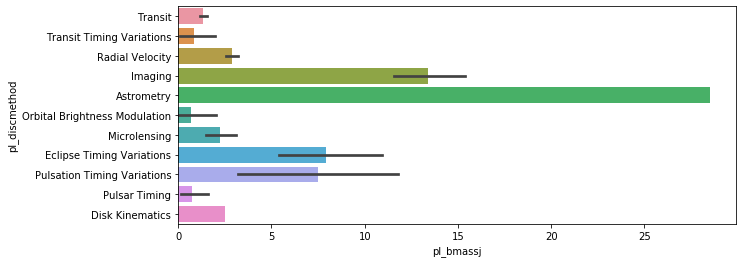

In [0]:
plt.figure(figsize=(10, 4))
sns.barplot(y='pl_discmethod',x='pl_bmassj',data=exo_data, orient='h')


Text(0, 0.5, '')

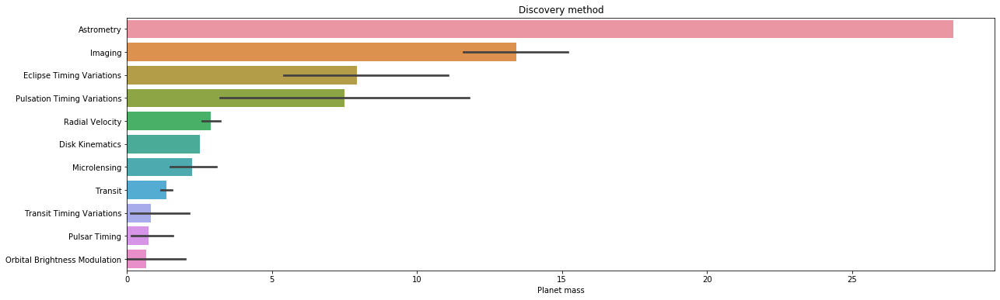

In [0]:
order_mass = exo_data.groupby(["pl_discmethod"])['pl_bmassj'].aggregate(np.mean).reset_index().sort_values('pl_bmassj')
plt.figure(figsize=(20, 6))
sns.barplot(x='pl_bmassj',y='pl_discmethod',data=exo_data,orient='h',order=order_mass['pl_discmethod'][::-1])
plt.title('Discovery method')
plt.xlabel('Planet mass')
plt.ylabel('')

In [0]:

alt.Chart(exo_data).mark_circle(size=80).encode(
    x=alt.X('st_dist:Q', axis=alt.Axis(format='f', title='Distance to host star (pc)'),scale=alt.Scale(zero=True, padding=0)),
    y=alt.Y('pl_radj:Q', axis=alt.Axis(format='f', title='Planet radius (R_Jupiter)'),scale=alt.Scale(zero=True, padding=0)),
    color=alt.Color('pl_discmethod', scale=alt.Scale(scheme='dark2')),
    size='pl_bmassj',
    tooltip=['st_dist', 'pl_bmassj', 'pl_radj', 'pl_dens'], # tooltips show selected column values when you hover over points
    opacity=alt.value(0.7)
    ).properties(
    title='Exoplanet Radius vs. Distance to Host Star: by discovery method, by mass',
      width=800,
      height=400).configure_axis(
    labelFontSize=14,
    titleFontSize=14
      ).configure_title(fontSize=20, anchor="middle")



alt.Chart(...)

In [0]:
# https://towardsdatascience.com/consistently-beautiful-visualizations-with-altair-themes-c7f9f889602


In [0]:
c = alt.Chart(exo_data).mark_circle(size=80).encode(
    x=alt.X('st_dist:Q', axis=alt.Axis(format='f', title='Distance to host star (pc)'),scale=alt.Scale(zero=True, padding=0)),
    y=alt.Y('pl_bmassj:Q', axis=alt.Axis(format='f', title='Planet mass (M_Jupiter)'),scale=alt.Scale(zero=True, padding=0)),
    color=alt.Color('pl_discmethod', scale=alt.Scale(scheme='dark2')),   #set1 category10 paired
    size=alt.Size('pl_bmassj'),
    tooltip=['st_dist', 'pl_bmassj', 'pl_radj', 'pl_dens'], # tooltips show selected column values when you hover over points
    opacity=alt.value(0.6)
    ).properties(
    title='Exoplanet Mass vs. Distance to Host Star: by discovery method',
      width=800,
      height=400).configure_axis(
    labelFontSize=14,
    titleFontSize=14
      ).configure_title(fontSize=20, anchor="middle")

c

alt.Chart(...)